In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv("Data/train_digit.csv")
df.shape

(42000, 785)

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
x=df.iloc[:,1:]
y=df.iloc[:,0]
x

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
y

0        1
1        0
2        1
3        4
4        0
        ..
41995    0
41996    1
41997    7
41998    6
41999    9
Name: label, Length: 42000, dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

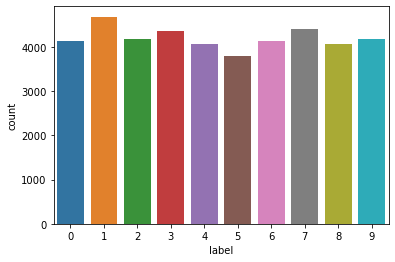

In [6]:
import seaborn as sns
sns.countplot(data=df,x=y)

In [7]:
df.sample(1)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
8688,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
import matplotlib.pyplot as plt

In [9]:
x.sample(1)

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
40172,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Text(0.5, 1.0, 'Number is five : 5 ')

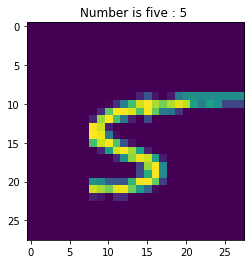

In [10]:
plt.imshow(x.iloc[244,:].values.reshape(28,28))
plt.title(f"Number is five : {y[244]} ")

Text(0.5, 1.0, 'Number is nine : 9 ')

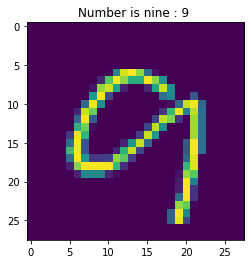

In [11]:
plt.imshow(x.iloc[5177,:].values.reshape(28,28))
plt.title(f"Number is nine : {y[5177]} ")

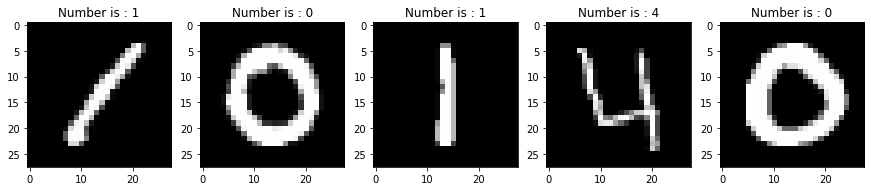

In [12]:
plt.figure(figsize=(15,10))
for i in range(5):
    plt.subplot(2,5,i+1)
    plt.imshow(x.iloc[i,:].values.reshape(28,28),cmap='gray')
    plt.show
    plt.title(f"Number is : {y[i]}")

In [13]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [14]:
x_train.shape

(29400, 784)

In [15]:
x_test.shape

(12600, 784)

In [16]:
from sklearn.neighbors import KNeighborsClassifier

In [17]:
knn = KNeighborsClassifier()

In [18]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [19]:
y_pred=knn.predict(x_test)

In [20]:
from sklearn.metrics import accuracy_score

In [21]:
accuracy_score(y_test,y_pred)


0.9657142857142857

In [22]:
from sklearn.preprocessing import StandardScaler

std = StandardScaler()
x_train_trf = std.fit_transform(x_train)
x_test_trf = std.transform(x_test)

x_train_trf

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [23]:
from sklearn.decomposition import PCA

In [24]:
pca=PCA(n_components=100)

In [25]:
x_train_pca=pca.fit_transform(x_train_trf)
x_test_pca=pca.transform(x_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


In [26]:
x_train_pca.shape

(29400, 100)

In [27]:
knn_pca=KNeighborsClassifier()
knn_pca.fit(x_train_pca,y_train)

KNeighborsClassifier()

In [28]:
y_pred_pca=knn_pca.predict(x_test_pca)

In [29]:
accuracy_score(y_test,y_pred_pca)

0.7676190476190476

In [30]:
for i in range(1,784):
    pca=PCA(n_components=i)
    x_train_pca=pca.fit_transform(x_train_trf)
    x_test_pca=pca.transform(x_test)
    knn.fit(x_train_pca,y_train)
    y_pred_pca = knn.predict(x_test_pca)
    print(f"Iteration : {i} {accuracy_score(y_test,y_pred_pca)}")

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 1 0.18642857142857142


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 2 0.1353174603174603


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 3 0.23103174603174603


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 4 0.2594444444444444


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 5 0.3628571428571429


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 6 0.40190476190476193


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 7 0.4301587301587302


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 8 0.47095238095238096


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 9 0.4726190476190476


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 10 0.4638888888888889


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 11 0.46793650793650793


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 12 0.483015873015873


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Iteration : 13 0.5442063492063492


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


KeyboardInterrupt: 

In [31]:
pca_dim=PCA(n_components=2)
x_train_pca=pca_dim.fit_transform(x_train_trf)
x_test_pca=pca_dim.transform(x_test)
x_train_pca.shape

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


(29400, 2)

In [32]:
import plotly.express as px
px.scatter(x_train_pca[:,0],x_train_pca[:,1],color=y_train)

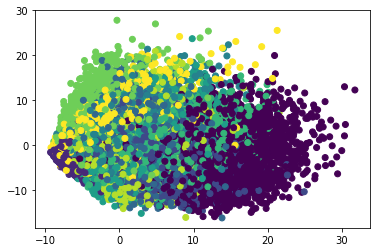

In [33]:
plt.scatter(x_train_pca[:,0],x_train_pca[:,1],c=y_train)

In [34]:
pca_dim=PCA(n_components=3)
x_train_pca=pca_dim.fit_transform(x_train_trf)
x_test_pca=pca_dim.transform(x_test)
x_train_pca.shape

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but PCA was fitted without feature names



(29400, 3)

In [35]:
d=y_train.astype(str)

In [36]:
px.scatter_3d(x=x_train_pca[:,0],y=x_train_pca[:,1],z=x_train_pca[:,2],color=d)

In [37]:
pca.explained_variance_

array([40.59588171, 29.31939629, 26.70539899, 20.79061606, 18.0643078 ,
       15.7586608 , 13.93062659, 12.52037379, 11.12722833, 10.08205971,
        9.71748853,  8.70917554,  8.01913059,  7.89063148])

In [38]:
pca.components_.shape

(14, 784)

In [39]:
pca.explained_variance_*100

array([4059.58817079, 2931.93962863, 2670.53989946, 2079.06160629,
       1806.43078001, 1575.86607958, 1393.06265887, 1252.03737853,
       1112.72283287, 1008.20597133,  971.7488529 ,  870.91755395,
        801.91305887,  789.06314834])

In [40]:
pca.explained_variance_ratio_*100

array([5.84935171, 4.22455317, 3.84790932, 2.99566411, 2.60283766,
       2.27062317, 2.00722662, 1.80402708, 1.60329249, 1.45269694,
       1.40016686, 1.25488174, 1.15545502, 1.13693993])

In [41]:
pca_dim.explained_variance_ratio_*100

array([5.84935171, 4.22455316, 3.84790929])

In [42]:
d = y_train.astype(str)
pca_dim = PCA()
x_train_pca = pca_dim.fit_transform(x_train_trf)
x_test_pca = pca_dim.transform(x_test)
pca_dim.explained_variance_ratio_*100



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but PCA was fitted without feature names



array([5.84935171e+00, 4.22455317e+00, 3.84790932e+00, 2.99566411e+00,
       2.60283768e+00, 2.27062325e+00, 2.00722706e+00, 1.80402768e+00,
       1.60330442e+00, 1.45271448e+00, 1.40019450e+00, 1.25521838e+00,
       1.15606423e+00, 1.13774951e+00, 1.07853036e+00, 1.03298491e+00,
       9.70395520e-01, 9.57399383e-01, 9.34237163e-01, 9.12905801e-01,
       8.58260664e-01, 8.33084537e-01, 8.04735721e-01, 7.70710198e-01,
       7.48672901e-01, 7.13847382e-01, 7.08900817e-01, 6.86255797e-01,
       6.51284381e-01, 6.37463674e-01, 6.28489824e-01, 6.22514458e-01,
       6.00492008e-01, 5.86809038e-01, 5.80058199e-01, 5.67056254e-01,
       5.49320588e-01, 5.35830886e-01, 5.23765424e-01, 5.10018441e-01,
       4.98834932e-01, 4.93105367e-01, 4.77954113e-01, 4.67097346e-01,
       4.62488902e-01, 4.57313741e-01, 4.54632903e-01, 4.41634541e-01,
       4.37056088e-01, 4.26388524e-01, 4.19607359e-01, 4.15478962e-01,
       4.05136934e-01, 4.01094749e-01, 3.88302168e-01, 3.85735414e-01,
      

In [43]:
pca_dim=PCA(n_components=None)
x_train_pca=pca_dim.fit_transform(x_train_trf)
x_test_pca=pca_dim.transform(x_test_trf)
pca.explained_variance_

array([40.59588171, 29.31939629, 26.70539899, 20.79061606, 18.0643078 ,
       15.7586608 , 13.93062659, 12.52037379, 11.12722833, 10.08205971,
        9.71748853,  8.70917554,  8.01913059,  7.89063148])

In [44]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05849352, 0.10073905, 0.13921814, 0.16917478, 0.19520316,
       0.21790939, 0.23798166, 0.25602193, 0.27205485, 0.28658182,
       0.30058349, 0.31313231, 0.32468686, 0.33605626])

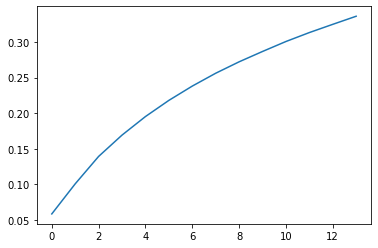

In [45]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))